<a href="https://colab.research.google.com/github/ziyongyao/APS360-rotten-fruit-detection-/blob/main/jeremy_aps360_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sriramr/fruits-fresh-and-rotten-for-classification")

print("Path to dataset files:", path)

100%|██████████| 3.58G/3.58G [00:38<00:00, 99.4MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/sriramr/fruits-fresh-and-rotten-for-classification/versions/1


In [2]:
import shutil
import os

path1='/content/original-fruits-dataset'
os.makedirs(path1, exist_ok=True)

shutil.move(path, path1)

print("Files moved to:", path1)


Files moved to: /content/original-fruits-dataset


We will first combine the training and testing set
 by fruits (apples, bananas, oranges). For the preprocessing, we will resize all images to a uniform
 dimension of 224x224 pixels to maintain consistency and compatibility with the CNN input require
ments. After that, we will convert the images to RGB colour space if they were not already, ensuring
 uniformity across the dataset. We will also perform manual checks on a random sample of images
 to verify the correctness of labels and correct any misclassifications found. After the preprocessing,
 we will split the dataset into training, validation, and test sets. We will randomly select 70 percent
 of our dataset from each fruit for training, 15 percent for validation, and 15 percent for testing our
 model.


In [3]:
# combine the training and testing set by fruits (apples, bananas, oranges)

import os
import shutil
import random

def combine_datasets(path):
  """Combines training and testing datasets by fruit type.

  Args:
    path: The path to the dataset.
  """
  new_path = "/content/fruits-dataset"

  fruits = ['freshapples', 'freshbanana', 'freshoranges','rottenapples', 'rottenbanana', 'rottenoranges']
  for fruit in fruits:
    train_dir = os.path.join(path, 'train', fruit)
    test_dir = os.path.join(path, 'test', fruit)
    combined_dir = os.path.join(new_path, fruit)

    if not os.path.exists(combined_dir):
      os.makedirs(combined_dir)

    if os.path.exists(train_dir):
      for filename in os.listdir(train_dir):
        src_path = os.path.join(train_dir, filename)
        dst_path = os.path.join(combined_dir, filename)
        shutil.copy(src_path, dst_path)

    if os.path.exists(test_dir):
      for filename in os.listdir(test_dir):
        src_path = os.path.join(test_dir, filename)
        dst_path = os.path.join(combined_dir, filename)
        shutil.copy(src_path, dst_path)


# Assuming 'path' variable is defined with the dataset path
path2=os.path.join(path1, '1', 'dataset')
combine_datasets(path2)

In [4]:
# resize all images to a uniform dimension of 224x224 pixels

from PIL import Image
import os

def resize_images(path):
  """Resizes all images in the dataset to 224x224 pixels.

  Args:
    path: The path to the dataset.
  """

  fruits = ['freshapples', 'freshbanana', 'freshoranges','rottenapples', 'rottenbanana', 'rottenoranges']
  for fruit in fruits:
    combined_dir = os.path.join(path, fruit)
    if os.path.exists(combined_dir):
      for filename in os.listdir(combined_dir):
        img_path = os.path.join(combined_dir, filename)
        try:
          img = Image.open(img_path)
          img = img.resize((224, 224))
          img.save(img_path)  # Overwrite the original image with the resized one
        except Exception as e:
          print(f"Error processing image {img_path}: {e}")

resize_images('/content/fruits-dataset')

In [5]:
# convert the images to RGB colour space if they were not already

def convert_to_rgb(path):
  """Converts images to RGB color space if they are not already.

  Args:
    path: The path to the dataset.
  """

  fruits = ['freshapples', 'freshbanana', 'freshoranges','rottenapples', 'rottenbanana', 'rottenoranges']
  for fruit in fruits:
    combined_dir = os.path.join(path, fruit)
    if os.path.exists(combined_dir):
      for filename in os.listdir(combined_dir):
        img_path = os.path.join(combined_dir, filename)
        try:
          img = Image.open(img_path)
          if img.mode != 'RGB':
            img = img.convert('RGB')
            img.save(img_path)  # Overwrite the original image with the RGB version
        except Exception as e:
          print(f"Error processing image {img_path}: {e}")


convert_to_rgb('/content/fruits-dataset')

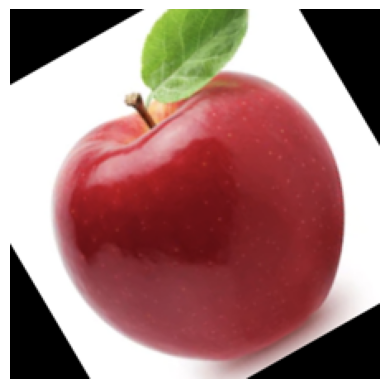

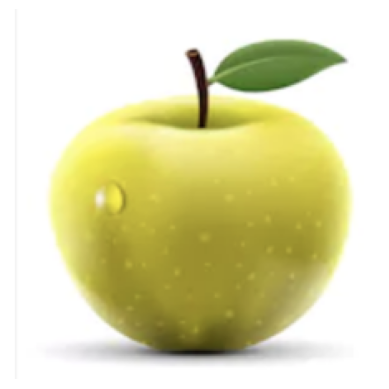

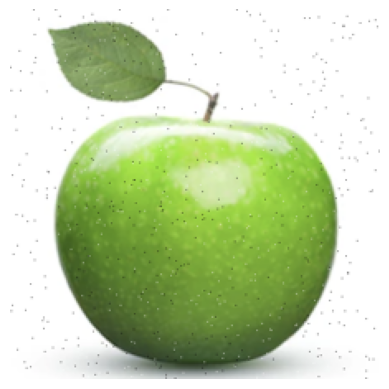

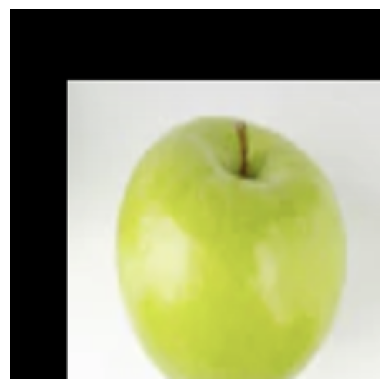

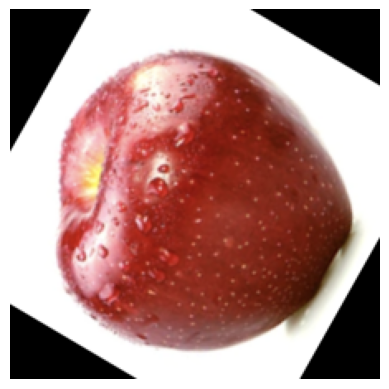

...

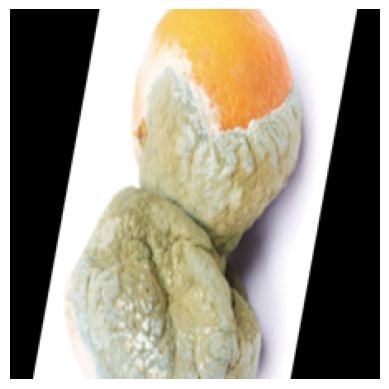

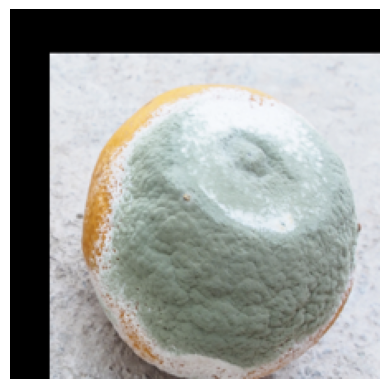

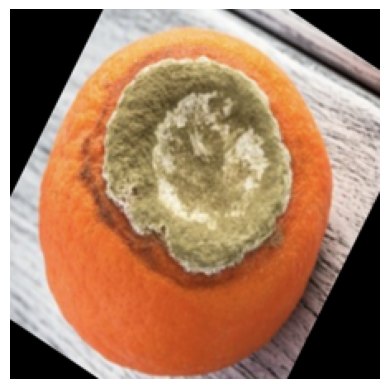

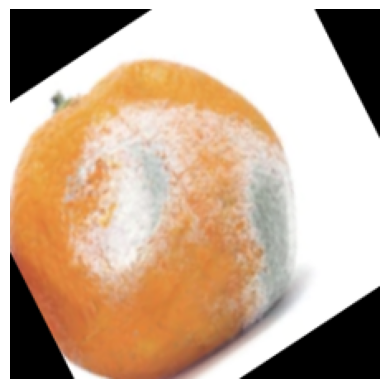

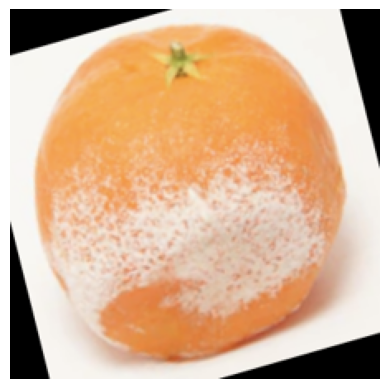

In [11]:
# perform manual checks on a random sample of images to verify the correctness of labels
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

def manual_check_labels(path, sample_size=20):
    """Performs manual checks on a random sample of images to verify labels."""
    fruits = ['freshapples', 'freshbanana', 'freshoranges', 'rottenapples', 'rottenbanana', 'rottenoranges']
    for fruit in fruits:
        combined_dir = os.path.join(path, fruit)
        if os.path.exists(combined_dir):
            image_files = os.listdir(combined_dir)
            random_sample = random.sample(image_files, min(sample_size, len(image_files)))

            for filename in random_sample:
                img_path = os.path.join(combined_dir, filename)
                try:
                    img = Image.open(img_path)

                    plt.imshow(img)
                    plt.axis('off')
                    plt.show()

                except Exception as e:
                    print(f"Error processing image {img_path}: {e}")

manual_check_labels('/content/fruits-dataset')



In [12]:
# split the dataset into training, validation, and test sets. We will randomly select 70 percent of our dataset from each fruit for training, 15 percent for validation, and 15 percent for testing our model.

import os
import shutil
import random

def split_dataset(path, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15):
  """Splits the dataset into training, validation, and test sets.

  Args:
    path: The path to the dataset.
    train_ratio: The proportion of the dataset to use for training.
    val_ratio: The proportion of the dataset to use for validation.
    test_ratio: The proportion of the dataset to use for testing.
  """

  fruits = ['freshapples', 'freshbanana', 'freshoranges','rottenapples', 'rottenbanana', 'rottenoranges']
  for fruit in fruits:
    combined_dir = os.path.join(path, fruit)
    if os.path.exists(combined_dir):
      image_files = os.listdir(combined_dir)
      random.shuffle(image_files)

      train_split = int(len(image_files) * train_ratio)
      val_split = int(len(image_files) * (train_ratio + val_ratio))

      train_images = image_files[:train_split]
      val_images = image_files[train_split:val_split]
      test_images = image_files[val_split:]

      for split_dir, image_list in zip(['train', 'val', 'test'], [train_images, val_images, test_images]):
        split_fruit_dir = os.path.join('/content/new-fruits-dataset', split_dir, fruit)
        if not os.path.exists(split_fruit_dir):
          os.makedirs(split_fruit_dir)

        for filename in image_list:
          src_path = os.path.join(combined_dir, filename)
          dst_path = os.path.join(split_fruit_dir, filename)
          shutil.move(src_path, dst_path)

split_dataset('/content/fruits-dataset')